### Macaque vocalizations

A labelled dataset of coo calls from specific individuals. 

Source:
- https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4806230/
- https://datadryad.org/handle/10255/dryad.101951

In [2]:
from pathlib2 import Path
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import re
import IPython

In [3]:
from avgn_paper.signalprocessing import spectrogramming as sg

In [4]:
import pdb
from joblib import Parallel, delayed
n_jobs = 10
verbosity = 5

In [5]:
from tqdm.autonotebook import tqdm
from librosa.core.time_frequency import mel_frequencies
from avgn_paper.signalprocessing.spectrogramming_tf import spectrogram_tensorflow
from avgn_paper.utils.audio import load_wav, float32_to_int16, int16_to_float32, write_wav
from avgn_paper.visualization.spectrogram import visualize_spec, plot_spec
from avgn_paper.utils.general import HParams
from avgn_paper.signalprocessing.filtering import butter_bandpass_filter

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


### data locations

In [6]:
DSLOC = Path('/mnt/cube/Datasets/Macaque')

In [133]:
WAVLIST = list((DSLOC / 'dataupload').expanduser().glob('*/*.wav'))

In [45]:
wav_df = pd.DataFrame(columns = ['loc', 'indv', 'idnum', 'vocdata', 'rate', 'voc_len'])
for wav in tqdm(WAVLIST):
    indv = wav.parent.stem
    idnum = int(wav.stem[2:])
    rate, data = load_wav(wav)
    
    wav_df.loc[len(wav_df)] = [wav, indv, idnum, data, rate, len(data)/rate]


In [49]:
print(len(wav_df))
wav_df[:3]

7285


,loc,indv,idnum,vocdata,rate,voc_len
0,/mnt/cube/Datasets/Macaque/dataupload/IO/IO184...,IO,184,"[-110, -98, -78, -70, -46, -33, -14, 3, 19, 42...",44100,0.298571
1,/mnt/cube/Datasets/Macaque/dataupload/IO/IO623...,IO,623,"[301, 285, 277, 255, 242, 220, 201, 176, 155, ...",44100,0.347982
2,/mnt/cube/Datasets/Macaque/dataupload/IO/IO997...,IO,997,"[196, 226, 253, 277, 295, 308, 317, 319, 316, ...",24414,0.511919


In [48]:
import seaborn as sns

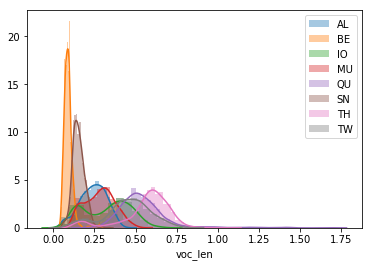

In [52]:
for indv in np.unique(wav_df.indv):
    sns.distplot( wav_df[wav_df.indv==indv]["voc_len"], label=indv)
plt.legend()

### Create spectrograms

In [57]:
def prepare_mel_matrix(hparams, return_numpy=True):
    # create a filter to convolve with the spectrogram
    mel_matrix = tf.signal.linear_to_mel_weight_matrix(
        num_mel_bins=hparams.num_mel_bins,
        num_spectrogram_bins=int(hparams.n_fft / 2) + 1,
        sample_rate=rate,
        lower_edge_hertz=hparams.mel_lower_edge_hertz,
        upper_edge_hertz=hparams.mel_upper_edge_hertz,
        dtype=tf.dtypes.float32,
        name=None,
    )
    
    # gets the center frequencies of mel bands
    mel_f = mel_frequencies(
        n_mels=hparams.num_mel_bins + 2,
        fmin=hparams.mel_lower_edge_hertz,
        fmax=hparams.mel_upper_edge_hertz,
    )

    # Slaney-style mel is scaled to be approx constant energy per channel (from librosa)
    enorm = tf.dtypes.cast(
        tf.expand_dims(
            tf.constant(
                2.0 / (mel_f[2 : hparams.num_mel_bins + 2] - mel_f[: hparams.num_mel_bins])
            ),
            0,
        ),
        tf.float32,
    )

    mel_matrix = tf.multiply(mel_matrix, enorm)
    mel_matrix = tf.divide(mel_matrix, tf.reduce_sum(mel_matrix, axis=0))
    if return_numpy:
        return mel_matrix.numpy()
    else:
        return mel_matrix

In [100]:
win_length_ms = 10
hop_length_ms = 2
print(win_length_ms / 1000 * rate)
print(hop_length_ms / 1000 * rate)

hparams = HParams(
    # spectrogramming
    win_length=int(rate / 1000 * win_length_ms),
    n_fft=1024,
    hop_length=int(rate / 1000 * hop_length_ms),
    ref_level_db=20,
    min_level_db=-80,
    preemphasis=0.97,
    # mel scaling
    num_mel_bins=64,
    mel_lower_edge_hertz=50,
    mel_upper_edge_hertz=5000,
    # inversion
    power=1.5,  # for spectral inversion
    griffin_lim_iters=50,
    pad=True,
    #
)
mel_matrix = prepare_mel_matrix(hparams)

244.14000000000001
48.828


In [101]:
wav_df[:3]

,loc,indv,idnum,vocdata,rate,voc_len
0,/mnt/cube/Datasets/Macaque/dataupload/IO/IO184...,IO,184,"[-110, -98, -78, -70, -46, -33, -14, 3, 19, 42...",44100,0.298571
1,/mnt/cube/Datasets/Macaque/dataupload/IO/IO623...,IO,623,"[301, 285, 277, 255, 242, 220, 201, 176, 155, ...",44100,0.347982
2,/mnt/cube/Datasets/Macaque/dataupload/IO/IO997...,IO,997,"[196, 226, 253, 277, 295, 308, 317, 319, 316, ...",24414,0.511919


In [102]:
audio = int16_to_float32(wav_df[wav_df.indv == 'SN'].vocdata.values[100])
spectrogram = sg.spectrogram(audio, hparams)
mel_spec = np.dot(spectrogram.T, mel_matrix).T

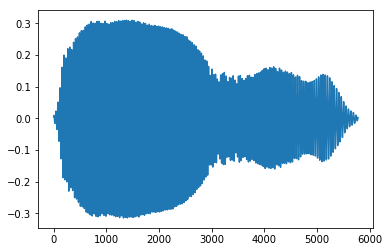

In [103]:
plt.plot(audio)
IPython.display.Audio(data=audio, rate=rate)

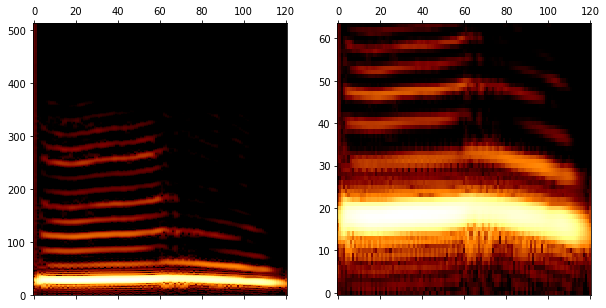

In [104]:
fig, axs = plt.subplots(ncols = 2, figsize=(10,5))
axs[0].matshow(spectrogram, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
axs[1].matshow(mel_spec, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
#ax.axis('off')

### Make spectrogram dataset

In [110]:
from PIL import Image 
def log_resize_spec(spec, spec_len_mul=20, freq_bins = 64):
    resize_shape = [int(np.log(np.shape(spec)[1])*spec_len_mul), freq_bins]
    resize_spec = np.array(Image.fromarray(spec).resize(resize_shape, Image.ANTIALIAS))
    return resize_spec

def pad_spectrogram(spectrogram, pad_length):
    """ Pads a spectrogram to being a certain length
    """
    excess_needed = pad_length - np.shape(spectrogram)[1]
    pad_left = np.floor(float(excess_needed) / 2).astype("int")
    pad_right = np.ceil(float(excess_needed) / 2).astype("int")
    return np.pad(
        spectrogram, [(0, 0), (pad_left, pad_right)], "constant", constant_values=0
    )

def make_spec(data, hparams):
    spectrogram = sg.spectrogram(data, hparams)
    #spectrogram = mask_spec(spectrogram)
    spectrogram = spectrogram/np.max(spectrogram)
    #return spectrogram
    mel_spec = np.dot(spectrogram.T, mel_matrix).T
    #mel_spec = mask_spec(mel_spec)
    mel_spec = log_resize_spec(mel_spec)
    mel_spec[mel_spec<0] = 0
    mel_spec = mel_spec/np.max(mel_spec)
    mel_spec = (mel_spec * 255).astype('uint8')
    return mel_spec

def mask_spec(spec, spec_thresh=.9, offset=1e-10):
    mask = spec >= (spec.max(axis=0,keepdims=1)*spec_thresh+offset)
    return spec*mask

In [111]:
spec = make_spec(int16_to_float32(wav_df[wav_df.indv == 'SN'].vocdata.values[100]), hparams)

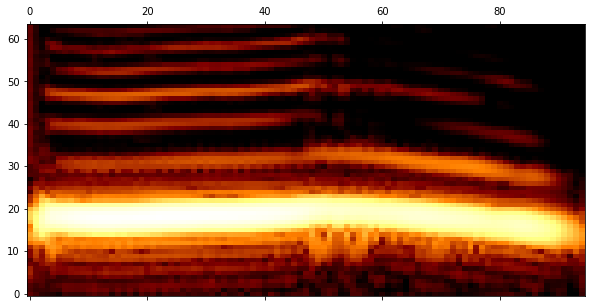

In [112]:
fig, ax = plt.subplots(ncols = 1, figsize=(10,5))
ax.matshow(spec, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
#ax.axis('off')

In [115]:
with Parallel(n_jobs=24, verbose=verbosity) as parallel:
    specs = parallel(
        delayed(make_spec)(int16_to_float32(row.vocdata), hparams)
        for idx, row in tqdm(
            wav_df.iterrows(), total = len(wav_df)
        )
    )

[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=24)]: Done 1656 tasks      | elapsed:    1.6s
[Parallel(n_jobs=24)]: Done 7285 out of 7285 | elapsed:    5.1s finished


In [116]:
spec_lens = np.array([np.shape(i)[1] for i in specs])

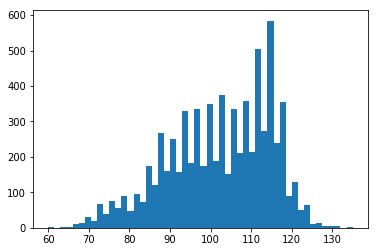

In [117]:
plt.hist(spec_lens, bins=50);

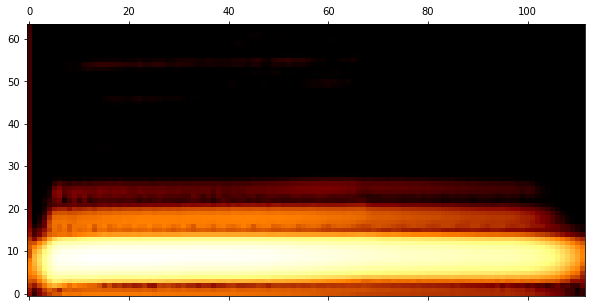

In [118]:
fig, ax = plt.subplots(ncols = 1, figsize=(10,5))
ax.matshow(specs[0], origin='lower', aspect='auto', cmap = plt.cm.afmhot)
#ax.axis('off')

In [119]:
def pad_spectrogram(spectrogram, pad_length):
    """ Pads a spectrogram to being a certain length
    """
    excess_needed = pad_length - np.shape(spectrogram)[1]
    pad_left = np.floor(float(excess_needed) / 2).astype("int")
    pad_right = np.ceil(float(excess_needed) / 2).astype("int")
    return np.pad(
        spectrogram, [(0, 0), (pad_left, pad_right)], "constant", constant_values=0
    )

In [120]:
with Parallel(n_jobs=24, verbose=verbosity) as parallel:
    specs_padded = parallel(
        delayed(pad_spectrogram)(spec, np.max(spec_lens))
        for spec in tqdm(
            specs
        )
    )

[Parallel(n_jobs=24)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done  96 tasks      | elapsed:    0.2s
[Parallel(n_jobs=24)]: Done 7285 out of 7285 | elapsed:    1.0s finished


In [121]:
wav_df['specs'] = specs_padded

In [122]:
spec = specs_padded[100]

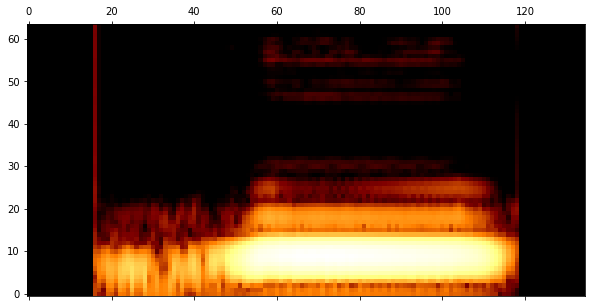

In [123]:
fig, ax = plt.subplots(ncols = 1, figsize=(10,5))
ax.matshow(spec, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
#ax.axis('off')

In [124]:
total_indv_vocs = pd.DataFrame(
    {indv: [np.sum(wav_df.indv == indv)] for indv in np.unique(wav_df.indv)}
).T.sort_values(by=0, ascending=False).T
total_indv_vocs

,TH,MU,IO,SN,AL,QU,BE,TW
0,1345,1017,1002,1001,999,975,478,468


In [125]:
def plot_voc_canvas(specs_padded, nrow = 6, ncol = 20, zoom = 2):
    """
    """
    dimx = np.shape(specs_padded[0])[0]
    dimy = np.shape(specs_padded[0])[1]

    canvas = np.zeros((nrow*dimx, ncol*dimy))
    cn = 0
    for row in range(nrow)[::-1]:
        for col in range(ncol):
            canvas[dimx*row:dimx*(row+1), dimy*col:dimy*(col+1)] = specs_padded[cn]
            cn += 1

    fig, ax = plt.subplots(figsize=(ncol*zoom*2, nrow*zoom))
    ax.matshow(canvas, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
    ax.axis('off')
    plt.show()

AL 999


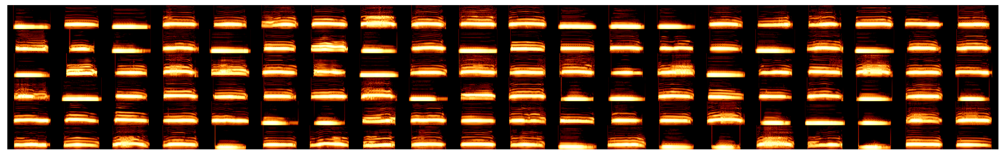

BE 478


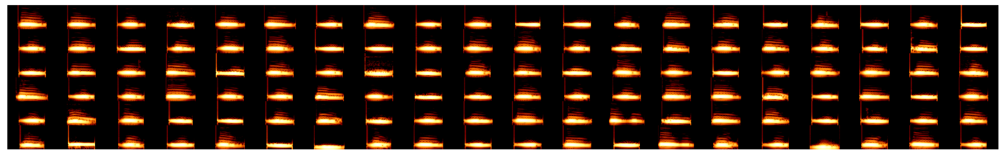

IO 1002


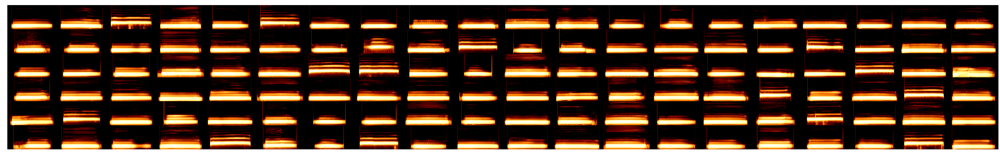

MU 1017


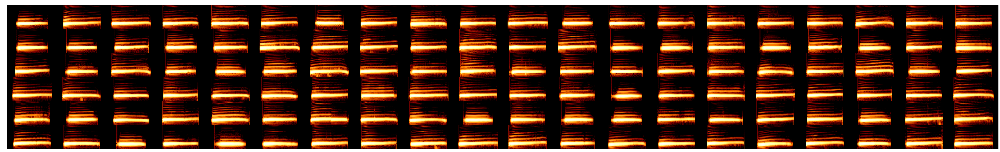

QU 975


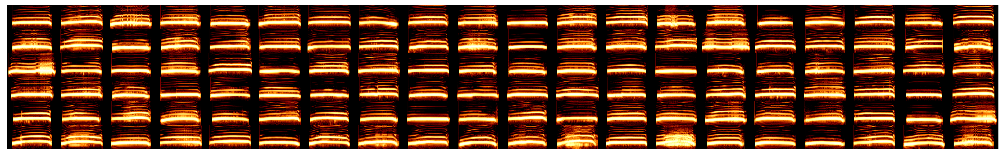

SN 1001


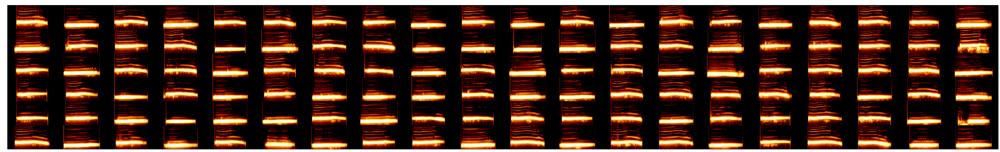

TH 1345


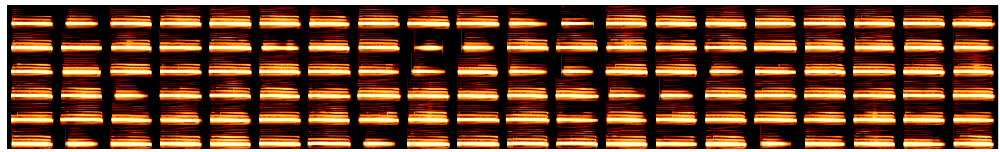

TW 468


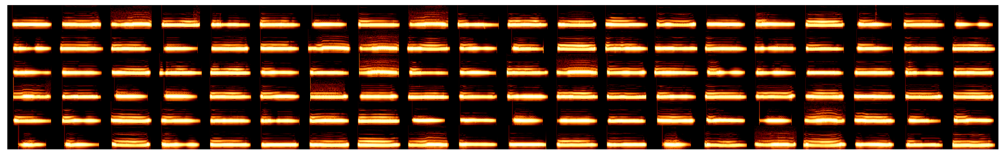

In [127]:
for indv in np.unique(wav_df.indv):
    indv_df = wav_df[
        (wav_df.indv == indv)
    ]
    print(indv, len(indv_df))
    plot_voc_canvas(indv_df.specs.values)

### UMAP

In [128]:
import umap
import seaborn as sns

In [129]:
specs = np.stack(wav_df.specs.values, axis=2).T
specs_flattened = np.reshape(specs, (np.shape(specs)[0], np.prod(np.shape(specs)[1:])))
len(specs_flattened)

7285

In [130]:
fit = umap.UMAP()
%time u_all = fit.fit_transform(specs_flattened)

CPU times: user 45.2 s, sys: 2.34 s, total: 47.5 s
Wall time: 38.1 s


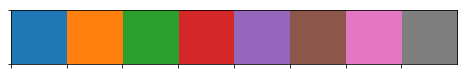

In [131]:
labs = wav_df.indv.values
pal = sns.color_palette(n_colors=len(np.unique(labs)))
sns.palplot(pal)
lab_dict = {lab:pal[i] for i, lab in enumerate(np.unique(labs))}
colors = np.array([lab_dict[i] for i in labs])

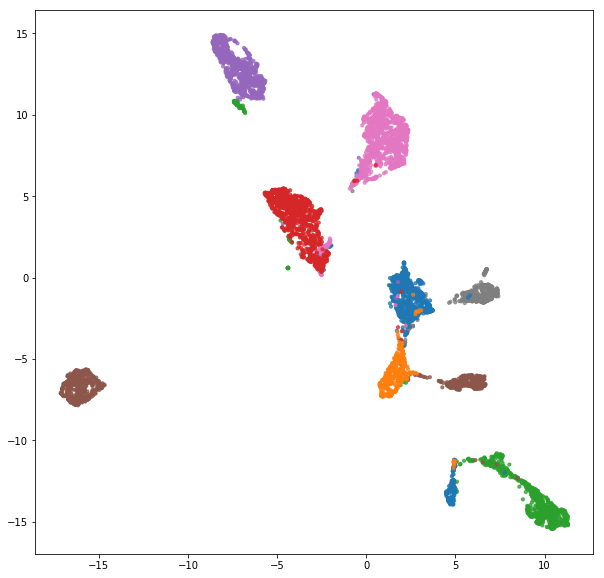

In [132]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(u_all[:,0], u_all[:,1], alpha = 0.75, s=10, color=colors)